#### **Import Libraries**

In [76]:
import jax 
import jax.numpy as jnp
import optax 
import matplotlib.pyplot as plt
from pathlib import Path
from functools import partial 
import os 
import flax 
import numpy as np
from rfp import MLP, Model, ModelParams
from rfp.utils import batch_matrix_with_padding
from rfp.losses import binary_cross_entropy, Supervised_Loss, mse
from rfp.train import Trainer
import pickle 
from collections import OrderedDict
from tqdm import tqdm
import pickle
import textwrap
import jax
jax.config.update("jax_debug_nans", True)
import math

#### **Plotting**

In [11]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

#### **Define Paths**

In [12]:
base_folder = str(Path(os.getcwd()).parent.parent.absolute())
np_link = base_folder + f"/evictions/data_np/prompt_scraped_data_False.npz"
print(base_folder)

/home/ubuntu


#### **Parameterize Notebook**

In [54]:
outcome_label = 'legalaid'
outcome_status = 'binary'       # Needed for the final activation of the neural network
covariates_label = 'Four'
instrument_label = 'treatment'
split_frac = 0.5
sims = 50
outer_epochs = 1000
nodes = 32
outer_lr = 0.01

#### **Read In Data**

In [67]:
# Load numpy data
loaded_data = np.load(np_link, allow_pickle=True)

# Feature Matrix
X = loaded_data[covariates_label][:,1:]
min_val = jnp.min(X, axis=0)
max_val = jnp.max(X, axis=0)
X_normalized = (X - min_val) / (max_val - min_val)
print(f"Feature shape: \t\t{X.shape}")

# Target
Y = loaded_data[outcome_label]
print(f"Outcome Shape: \t\t{Y.shape}")

# Instrument
Z = loaded_data[instrument_label]
print(f"Instrument Shape:  \t{Z.shape}")

# Treatment ++ Instrument 
XZ_normalized = jnp.hstack([X_normalized, Z]) 

sample_weights =  loaded_data['sample_weight']
print(f"Weight Shape: \t\t{sample_weights.shape}\n\n")

print(f"Min 'Raw' sample weight: {jnp.min(sample_weights)}, Max 'Raw' sample weight: {jnp.max(sample_weights)}")
normalized_weights = sample_weights / jnp.sum(sample_weights)

Feature shape: 		(9797, 29)
Outcome Shape: 		(9797, 1)
Instrument Shape:  	(9797, 1)
Weight Shape: 		(9797,)


Min 'Raw' sample weight: 1.0, Max 'Raw' sample weight: 4.461538314819336


#### **Setup**

In [68]:
features = XZ_normalized.shape[1] 
mlp = MLP([nodes, nodes], jax.nn.relu)
model = Model(mlp, jax.nn.sigmoid if outcome_status == 'binary' else lambda x: x)
supervised_loss = Supervised_Loss(binary_cross_entropy, model.embellished_fwd_pass, reg_value=0, aux_status=False)
yuri = Trainer(supervised_loss, optax.sgd(learning_rate=outer_lr, momentum=0.9), outer_epochs)

#### **Initial Predictions**

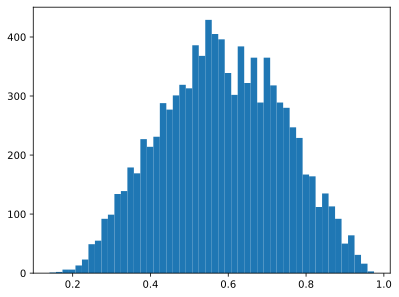

In [72]:
def hist_predictions(key):
    params = ModelParams.init_fn(key, mlp, features)
    yhat = model.fwd_pass(params, XZ_normalized)
    plt.hist(yhat.reshape(-1,), bins=50)
    plt.show()

hist_predictions(jax.random.PRNGKey(0))


#### **Training**

In [73]:
StandardResults = {}
key = jax.random.PRNGKey(0)
for i in tqdm(range(sims)):

    # Create Keys
    key, subkey1, subkey2, subkey3, subkey4 = jax.random.split(key, 5)

    # Initialize the parameters
    params = ModelParams.init_fn(subkey1, mlp, features)

    # Split Train and Validation Data
    idx = jax.random.permutation(subkey2, XZ_normalized.shape[0])

    # Training Indices
    train_idx = idx[:int(split_frac * XZ_normalized.shape[0])]
    p_train = normalized_weights[train_idx]/jnp.sum(normalized_weights[train_idx])
    train_idx = jax.random.choice(subkey3, train_idx, shape=(train_idx.shape[0],), p=p_train)
    is_in_train = jnp.isin(jnp.arange(XZ_normalized.shape[0]), train_idx)                                   # Check if the index is in the validation set


    # Validation Indices
    val_idx = idx[int(split_frac * XZ_normalized.shape[0]):]
    p_val = normalized_weights[val_idx]/jnp.sum(normalized_weights[val_idx])
    val_idx = jax.random.choice(subkey4, val_idx, shape=(val_idx.shape[0],), p=p_val)
    is_in_val = jnp.isin(jnp.arange(XZ_normalized.shape[0]), val_idx)                                   # Check if the index is in the validation set

    # Train the model
    params, opt_params, train_loss_history, val_loss_history = yuri.train_with_val(params, XZ_normalized, Y, jnp.ones_like(Y), is_in_train, is_in_val)
    StandardResults[i] = {'params': opt_params, 
                          'train_loss_history': train_loss_history, 
                          'val_loss_history': val_loss_history,
                          'val_idx': is_in_val}

100%|██████████| 50/50 [00:39<00:00,  1.28it/s]


#### **Visualize Training Runs**

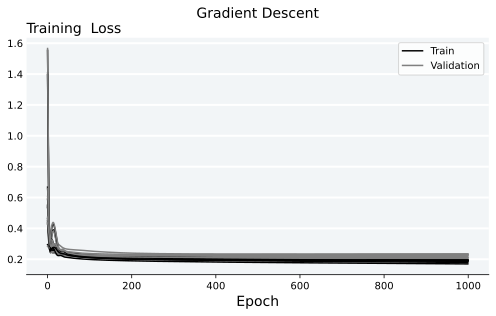

In [79]:
fig = plt.figure(dpi=300, tight_layout=True, figsize=(7, 4.5))
ax = plt.axes(facecolor=(.95, .96, .97))
ax.set_title('Gradient Descent', size=14, loc='center', pad=20)

# Plot customizations
for key in 'left', 'right', 'top':
    ax.spines[key].set_visible(False)
ax.text(0., 1.02, s='Training  Loss', transform=ax.transAxes, size=14)
ax.yaxis.set_tick_params(length=0)
ax.yaxis.grid(True, color='white', linewidth=2)
ax.set_axisbelow(True)
for i in range(jnp.minimum(10, sims)):
    if i == 1:
        plt.plot(StandardResults[i]['train_loss_history'], color='black', label='Train')
        plt.plot(StandardResults[i]['val_loss_history'], color='grey', label='Validation')
    else:
        plt.plot(StandardResults[i]['train_loss_history'], color='black')
        plt.plot(StandardResults[i]['val_loss_history'], color='grey')
plt.xlabel('Epoch', size=14)
plt.legend()
plt.show()

#### **Check for Nans**

In [80]:
for i in range(sims):
    assert jnp.isnan(model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.ones_like(Z))))).any() == False, i
    assert jnp.isnan(model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.zeros_like(Z))))).any() == False, i

#### **Out of Sample Predictions**

In [82]:
r1 = jnp.hstack([model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.ones_like(Z)))) for i in range(sims)])
r0 = jnp.hstack([model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.zeros_like(Z)))) for i in range(sims)])
idx = jnp.hstack([StandardResults[i]['val_idx'].reshape(-1,1) for i in range(sims)])
avg1 = jnp.sum(r1 * idx, axis=1)/ jnp.sum(idx, axis=1)
avg0 = jnp.sum(r0 * idx, axis=1)/ jnp.sum(idx, axis=1)
print(jnp.mean(avg1 - avg0))

0.12041912


#### **Plot Effect**

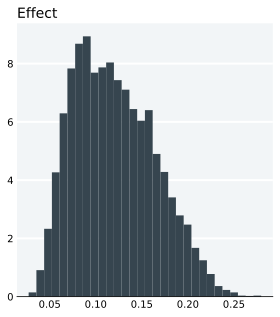

In [85]:
fig = plt.figure(dpi=300, tight_layout=True, figsize=(4, 4.5))
ax = plt.axes(facecolor=(.95, .96, .97))
ax.xaxis.set_tick_params(length=0, labeltop=False, labelbottom=True)

for key in 'left', 'right', 'top':
    ax.spines[key].set_visible(False)

ax.text(0., 1.02, s='Effect', transform=ax.transAxes, size=14)
ax.yaxis.set_tick_params(length=0)
ax.yaxis.grid(True, color='white', linewidth=2)
ax.set_axisbelow(True)
plt.hist(avg1 - avg0, color='#36454F', density=True, bins=30)
plt.show()


#### **Heterogenious Effect**

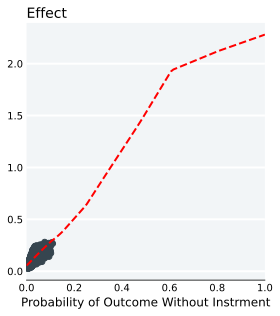

In [105]:
if outcome_status == 'binary':
    features = 1
    outer_epochs = 1000
    mlp = MLP([32, 32], jax.nn.relu)
    loess_model = Model(mlp, lambda x: x)
    supervised_loss = Supervised_Loss(mse, loess_model.embellished_fwd_pass, reg_value=0, aux_status=False)
    outer_lr = 0.01
    yuri = Trainer(supervised_loss, optax.sgd(learning_rate=outer_lr, momentum=0.9), outer_epochs)
    params = ModelParams.init_fn(jax.random.PRNGKey(0), mlp, features)
    params,_   = yuri.train(params, avg0.reshape(-1,1), (avg1-avg0).reshape(-1,1), jnp.ones_like(avg0).reshape(-1,1))

    fig = plt.figure(dpi=300, tight_layout=True, figsize=(4, 4.5))
    ax = plt.axes(facecolor=(.95, .96, .97))
    ax.xaxis.set_tick_params(length=0, labeltop=False, labelbottom=True)

    for key in 'left', 'right', 'top':
        ax.spines[key].set_visible(False)

    ax.text(0., 1.02, s='Effect', transform=ax.transAxes, size=14)
    ax.yaxis.set_tick_params(length=0)
    ax.yaxis.grid(True, color='white', linewidth=2)
    ax.set_axisbelow(True)

    plt.scatter(avg0, avg1-avg0, color='#36454F')
    xs = jnp.linspace(0, 1, 100)
    plt.plot(xs, loess_model.fwd_pass(params, xs.reshape(-1,1)), color='red', linewidth=2, linestyle='--')
    plt.xlim(0, 1)
    plt.xlabel("Probability of Outcome Without Instrment", size=12)
    plt.show()

In [104]:
if outcome_status == 'binary':
    StandardResults['Estimated_Effect'] = []
    fig = plt.figure(dpi=300, tight_layout=True, figsize=(7, 4.5))
    ax = plt.axes()
    ax.xaxis.set_tick_params(length=0, labeltop=False, labelbottom=True)

    for key in 'left', 'right', 'top':
        ax.spines[key].set_visible(False)

    ax.text(0., 1.02, s='P(Outcome=1|X, Z=1)', transform=ax.transAxes, size=14)
    ax.yaxis.set_tick_params(length=2)
    ax.yaxis.grid(True, color='white', linewidth=2)
    ax.set_axisbelow(True)

    value = 0.0
    for k in range(8):
        xs = jnp.linspace(0, jnp.max(jnp.max(r0)), 100)
        ys = jax.vmap(lambda x: x + value)(xs)
        plt.plot(xs, ys, linestyle='--', linewidth=1, color='grey')
        ax.annotate(f"{value:.2f}", (jnp.max(jnp.max(r0)), jnp.max(jnp.max(r0)) + value), color='black', fontsize=8)
        value += 0.05
    ax.annotate("Effect", (jnp.max(jnp.max(r0)), jnp.max(r1) + 0.075) , color='black', fontsize=8, weight='bold')

    for i in tqdm(range(jnp.minimum(sims, 10))):
        outcome1 = model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.ones_like(Z)))) 
        outcome0 =  model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.zeros_like(Z))) )

        Estimated_Effect = outcome1 - outcome0
        StandardResults['Estimated_Effect'].append(jnp.dot(Estimated_Effect.reshape(-1,), normalized_weights))
        
        plt.scatter(outcome0, outcome1, s=3, alpha=0.5)

    plt.xlabel("P(Outcome=1|X, Z=0)", size=14)
    plt.ylim(0, jnp.max(r1)+0.1)
    plt.xlim(0, jnp.max(r0)+0.05)
    plt.show()

100%|██████████| 10/10 [00:00<00:00, 10.36it/s]
